In [1]:
# Hotspot for multiple species
import hotspot
import scanpy as sc
import numpy as np
import pandas as pd
import matplotlib
import mplscience
import os
import matplotlib.pyplot as plt

In [ ]:
# Generate adata_concat with whole metabolite intensity information
RESOURCES_FOLDERNAME = '/data/project/AI4Omic/MASLD/data/MALDI/MSI.RMS'
RESULTS_FOLDERNAME = '/data/project/AI4Omic/MASLD/results/SM/Hotspot'
sc.settings.set_figure_params(dpi=300, fontsize=10, dpi_save=300, format='pdf')
sc.settings.figdir = RESULTS_FOLDERNAME

In [ ]:
samplefiles = {}
for filename in os.listdir(RESOURCES_FOLDERNAME):
    if filename.endswith('.txt'):
        sample_name = filename.split('_')[0]
        samplefiles[sample_name] = filename
print(samplefiles) # 27 samples
sample_list = list(samplefiles.keys())

# Define the order of samples by disease_status
disease_order = ['CTRL', 'MASL', 'MASH']

# Sort sample_list based on the disease_status order
sorted_sample_list = sorted(sample_list, key=lambda x: disease_order.index(x.split('-')[0]))
sorted_sample_list

{'CTRL-180': 'CTRL-180_coordinates_intensities.txt', 'MASLD-1498': 'MASLD-1498_coordinates_intensities.txt', 'MASLD-4973': 'MASLD-4973_coordinates_intensities.txt', 'MASH-1475': 'MASH-1475_coordinates_intensities.txt', 'MASLD-1492': 'MASLD-1492_coordinates_intensities.txt', 'CTRL-179': 'CTRL-179_coordinates_intensities.txt', 'MASLD-1497': 'MASLD-1497_coordinates_intensities.txt', 'CTRL-5759': 'CTRL-5759_coordinates_intensities.txt', 'CTRL-161': 'CTRL-161_coordinates_intensities.txt', 'MASLD-1479': 'MASLD-1479_coordinates_intensities.txt', 'MASLD-9993': 'MASLD-9993_coordinates_intensities.txt', 'CTRL-8715': 'CTRL-8715_coordinates_intensities.txt', 'MASH-1494': 'MASH-1494_coordinates_intensities.txt', 'MASH-9136': 'MASH-9136_coordinates_intensities.txt', 'MASLD-1493': 'MASLD-1493_coordinates_intensities.txt', 'MASH-0422': 'MASH-0422_coordinates_intensities.txt', 'MASH-1481': 'MASH-1481_coordinates_intensities.txt', 'MASLD-1495': 'MASLD-1495_coordinates_intensities.txt', 'CTRL-5113': 'CTR

['CTRL-180',
 'CTRL-179',
 'CTRL-5759',
 'CTRL-161',
 'CTRL-8715',
 'CTRL-5113',
 'MASLD-1498',
 'MASLD-4973',
 'MASLD-1492',
 'MASLD-1497',
 'MASLD-1479',
 'MASLD-9993',
 'MASLD-1493',
 'MASLD-1495',
 'MASLD-0966',
 'MASH-1475',
 'MASH-1494',
 'MASH-9136',
 'MASH-0422',
 'MASH-1481',
 'MASH-1478',
 'MASH-1501',
 'MASH-7866',
 'MASH-1480',
 'MASH-0413',
 'MASH-8684',
 'MASH-1086']

In [4]:
# Useful functions for adata generating from maldi raw sequencing file
def readOrifile(filename ):
    nodefeatlabelsdict = {}
    f = open(filename)
    line = f.readline()
    tokens = line.strip().split('\t')
    nodefeatlabels = [float(i) for i in tokens[4:]]
    for i in range(len(nodefeatlabels)):
        nodefeatlabelsdict[float(nodefeatlabels[i])] = i
    xs = []
    ys = []
    nodefeats = []
    for line in f:
        if line.strip()!='':
            tokens = line.strip().split('\t')
            x = float(tokens[2])
            y = float(tokens[3])
            feat = tokens[4:]
            nodefeat = [float(k) for k in feat]
            xs.append(x)
            ys.append(y)
            nodefeats.append(nodefeat)
    return np.array(xs),np.array(ys),nodefeatlabels,nodefeatlabelsdict,np.array(nodefeats)

def genadata(xs,ys,nodefeats,sample,varindex):
    pos = np.stack((xs,ys),axis=-1)
    adata = sc.AnnData(X=nodefeats)
    adata.obsm['spatial'] = pos
    adata.uns['spatial'] = {sample: {}}
    adata.obs['sample'] = sample
    adata.var = varindex
    return adata

In [ ]:
adatas = {}
for sample in sorted_sample_list:
    # Anndata object generation
    xs, ys, nodefeatlabels, nodefeatlabelsdict, nodefeats = readOrifile(os.path.join(RESOURCES_FOLDERNAME, samplefiles[sample]))
    varindex = pd.DataFrame(index = nodefeatlabels)
    ad = genadata(xs, ys, nodefeats, sample, varindex)
    ad.var_names = ad.var_names.astype(str)
    ad.obs['sample'] = sample_list[sample_list.index(sample)]
    ad.obs['disease_status'] = sample.split('-')[0]
    ad.obs_names = ad.obs['sample'] + '_' + ad.obs_names
    
    ad.layers['counts'] = ad.X.copy()

    # Add clinical metadata
    clinical_info = pd.read_csv('/data/project/AI4Omic/MASLD/results/ST/clinical_info.csv')
    ad.obs['Age'] = clinical_info.loc[clinical_info['sample'] == ad.obs['sample'][0], 'Age'].values[0]
    ad.obs['Sex'] = clinical_info.loc[clinical_info['sample'] == ad.obs['sample'][0], 'Sex'].values[0]
    ad.obs['Steatosis'] = clinical_info.loc[clinical_info['sample'] == ad.obs['sample'][0], 'Steatosis'].values[0]
    ad.obs['Ballooning'] = clinical_info.loc[clinical_info['sample'] == ad.obs['sample'][0], 'Ballooning'].values[0]
    ad.obs['Lobular_inflammation'] = clinical_info.loc[clinical_info['sample'] == ad.obs['sample'][0], 'Lobular_inflammation'].values[0]
    ad.obs['Fibrosis'] = clinical_info.loc[clinical_info['sample'] == ad.obs['sample'][0], 'Fibrosis'].values[0]
    ad.obs['NAS'] = clinical_info.loc[clinical_info['sample'] == ad.obs['sample'][0], 'NAS'].values[0]
    
    #Rotate 90 degrees conterclockwise
    ad.obsm['spatial'] = np.column_stack((ad.obsm['spatial'][:, 1], ad.obsm['spatial'][:, 0].max() - ad.obsm['spatial'][:, 0]))
    
    # add ad to adatas
    adatas[sample] = ad

/home/bailab/miniconda3/envs/hotspot/lib/python3.11/site-packages/anndata/_core/anndata.py:750: UserWarning: 
AnnData expects .var.index to contain strings, but got values like:
    [123.0557, 125.0004, 125.0711, 126.0044, 127.0048]

    Inferred to be: floating

  value_idx = self._prep_dim_index(value.index, attr)
/tmp/ipykernel_4058461/1269651891.py:16: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  ad.obs['Age'] = clinical_info.loc[clinical_info['sample'] == ad.obs['sample'][0], 'Age'].values[0]
/tmp/ipykernel_4058461/1269651891.py:17: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  ad.obs['Sex'] = clinical_info.loc

In [ ]:
import anndata as ad
adata = ad.concat(adatas, label='sample', join='outer', fill_value=0)
adata.obs['disease_status'] = adata.obs['disease_status'].astype('category').cat.reorder_categories(['CTRL', 'MASL', 'MASH'])
adata.uns['disease_status_colors'] = ['#a6cee3', '#fdbf6f', '#b15928']

# Add metadata
Met_annotation = pd.read_excel('/data/project/AI4Omic/MASLD/data/MALDI/identification.xlsx')
Met_annotation.loc[:,'Precursor (Da)'] = Met_annotation.loc[:,'Precursor (Da)'].astype(str)
adata.var = adata.var.merge(Met_annotation, right_on='Precursor (Da)', left_index=True, sort=False, how='left')
adata.var.set_index('Precursor (Da)', inplace=True)

# Two batches for MALDI-MSI data
batch_2022 = ['CTRL-161', 'CTRL-179', 'CTRL-180', 'MASH-1475', 'MASH-1478', 'MASH-1480', 'MASH-1481', 'MASH-1494', 'MASH-1501', 'MASLD-1479','MASLD-1492', 'MASLD-1493', 'MASLD-1495', 'MASLD-1497','MASLD-1498']
batch_2024 = ['CTRL-5113', 'CTRL-5759', 'CTRL-8715', 'MASH-0413', 'MASH-0422', 'MASH-1086', 'MASH-7866', 'MASH-8684', 'MASH-9136', 'MASLD-0966', 'MASLD-4973', 'MASLD-9993']
adata.obs['batch'] = np.where(adata.obs['sample'].isin(batch_2022), '2022', '2024')

/tmp/ipykernel_4058461/3427967667.py:8: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise in a future error of pandas. Value '['123.0557' '125.0004' '125.0711' ... '1279.6214' '1289.7028' '1296.6244']' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.
  Met_annotation.loc[:,'Precursor (Da)'] = Met_annotation.loc[:,'Precursor (Da)'].astype(str)
/home/bailab/miniconda3/envs/hotspot/lib/python3.11/site-packages/anndata/_core/anndata.py:750: UserWarning: 
AnnData expects .var.index to contain strings, but got values like:
    [0.0, 1.0, 2.0, 3.0, 4.0]

    Inferred to be: floating

  value_idx = self._prep_dim_index(value.index, attr)


In [ ]:
sc.pl.violin(adata, keys=['total_counts', 'n_genes_by_counts'], groupby='batch', rotation=90)

In [8]:
# Filter noise metebolites
sc.pp.calculate_qc_metrics(adata, inplace=True)
adata = adata[:, adata.var['pct_dropout_by_counts'].values <= 95] # 1533 -> 1528

# Filter MSI data points 
sc.pp.filter_cells(adata, min_counts=40000)
sc.pp.filter_cells(adata, min_genes=700) # 872792 -> 841534

/home/bailab/miniconda3/envs/hotspot/lib/python3.11/site-packages/scanpy/preprocessing/_simple.py:166: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  adata.obs["n_counts"] = number


/tmp/ipykernel_4058461/2139105418.py:5: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  coords_df['x_pixel'] = coords_df.groupby('sample')['x_pixel'].transform(lambda x: x - x.min())


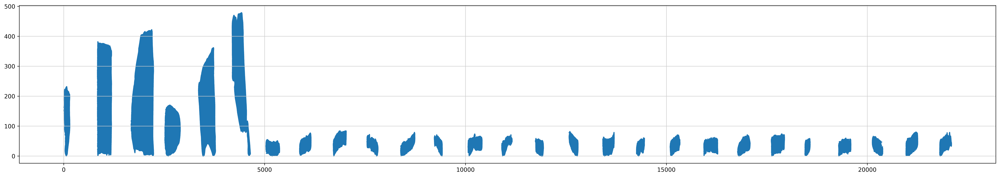

In [10]:
# Staggering
adata.obs.loc[:, ['x_pixel', 'y_pixel']] = adata.obsm['spatial'].copy()
coords_df = pd.DataFrame(adata.obs[['x_pixel', 'y_pixel', 'sample']])

coords_df['x_pixel'] = coords_df.groupby('sample')['x_pixel'].transform(lambda x: x - x.min())
global_max_x = max(coords_df['x_pixel']) * 1.5

# Turn samples into factors
coords_df['sample_no'] = pd.Categorical(coords_df['sample']).codes

# Update x coordinates
coords_df['x_pixel'] = coords_df['x_pixel'] + global_max_x * coords_df['sample_no']
coords_df

# Update staggered coords to AnnData object
adata.obs['x_pixel'] = coords_df['x_pixel']
adata.obs['y_pixel'] = coords_df['y_pixel']

# After staggering the spatial coordinates
fig = plt.figure(figsize=(30, 5))
scatterplot = plt.scatter(adata.obs['x_pixel'], adata.obs['y_pixel'], s=0.5)

# change the spatial coordinates
adata.obsm['spatial'] = np.column_stack((adata.obs['x_pixel'], adata.obs['y_pixel']))

In [ ]:
#adata.write('/data/project/AI4Omic/MASLD/results/SM/Hotspot/adata_concat.h5ad')
#adata_concat = sc.read_h5ad('/data/project/AI4Omic/MASLD/results/SM/Hotspot/adata_concat.h5ad')
#adata.write('/data/project/AI4Omic/MASLD/results/SM/Hotspot/adata.h5ad')
adata = sc.read_h5ad('/data/project/AI4Omic/MASLD/results/SM/Hotspot/adata.h5ad')

In [126]:
# Retrieve the batch 2024 data
# 2022 batch
#adata = adata_concat[adata_concat.obs['batch'] == '2022'] # 353664  pixels

# 2024 batch
#adata = adata_concat[adata_concat.obs['batch'] == '2024'] # 487870   pixels
sc.pp.filter_cells(adata, min_counts=60000)
sc.pp.filter_cells(adata, min_genes=800) # 487870 -> 453149 

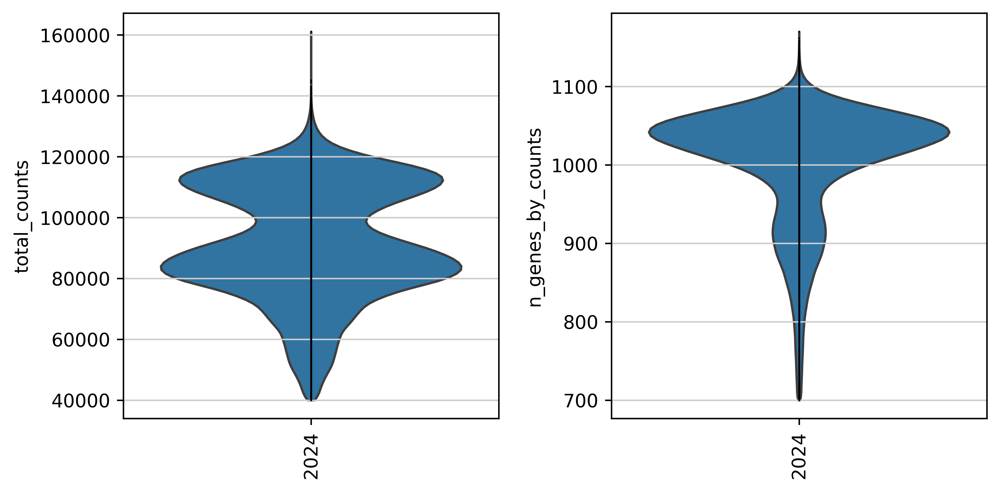

In [125]:
sc.pl.violin(adata, keys=['total_counts', 'n_genes_by_counts'], groupby='batch', rotation=90, jitter=0)

In [7]:
# Normalization
sc.pp.normalize_total(adata, target_sum=1, inplace=True)
sc.pp.log1p(adata, base=2)

In [8]:
# Hotspot pipeline
from scipy.sparse import csr_matrix
adata.X = csr_matrix(adata.X)
adata.layers['csc_counts'] = adata.X.tocsc()

# Using spatial to evaluate cell-similarity
hs = hotspot.Hotspot(adata, layer_key="csc_counts", model='normal', latent_obsm_key="spatial", umi_counts_obs_key="total_counts")
    
#hs.create_knn_graph(weighted_graph=True, n_neighbors=30) # important parameters
hs.create_knn_graph(weighted_graph=False, n_neighbors=6) # important parameters
hs_results = hs.compute_autocorrelations(jobs = 80)
hs_genes =  hs_results.loc[hs_results.FDR < 0.01].index
print(f'the number of hs_genes is {len(hs_genes)}')
#hs_genes =  hs_results.loc[hs_results.FDR < 0.05].sort_values('Z',ascending=False).head(800).index
#hs_genes = hs_results.index.drop(Edge_metabolites['metabolites'].astype(str))
#hs_genes =  hs_results.sort_values('FDR',ascending=True).head(950).index
#hs_genes = hs_results.index
lcz = hs.compute_local_correlations(hs_genes, jobs = 80)
lcz.to_csv(f'{RESULTS_FOLDERNAME}/Allsamples-hotspot_lcz.csv',index=False)

100%|██████████| 1528/1528 [01:07<00:00, 22.56it/s]


the number of hs_genes is 1528
Computing pair-wise local correlation on 1528 features...


100%|██████████| 1166628/1166628 [03:52<00:00, 5018.51it/s]


Module
-1     587
 1     113
 16     85
 12     76
 18     74
 9      72
 4      60
 15     48
 13     47
 11     41
 17     41
 3      40
 7      32
 8      32
 2      31
 10     31
 19     28
 14     25
 20     23
 5      21
 6      21
Name: count, dtype: int64


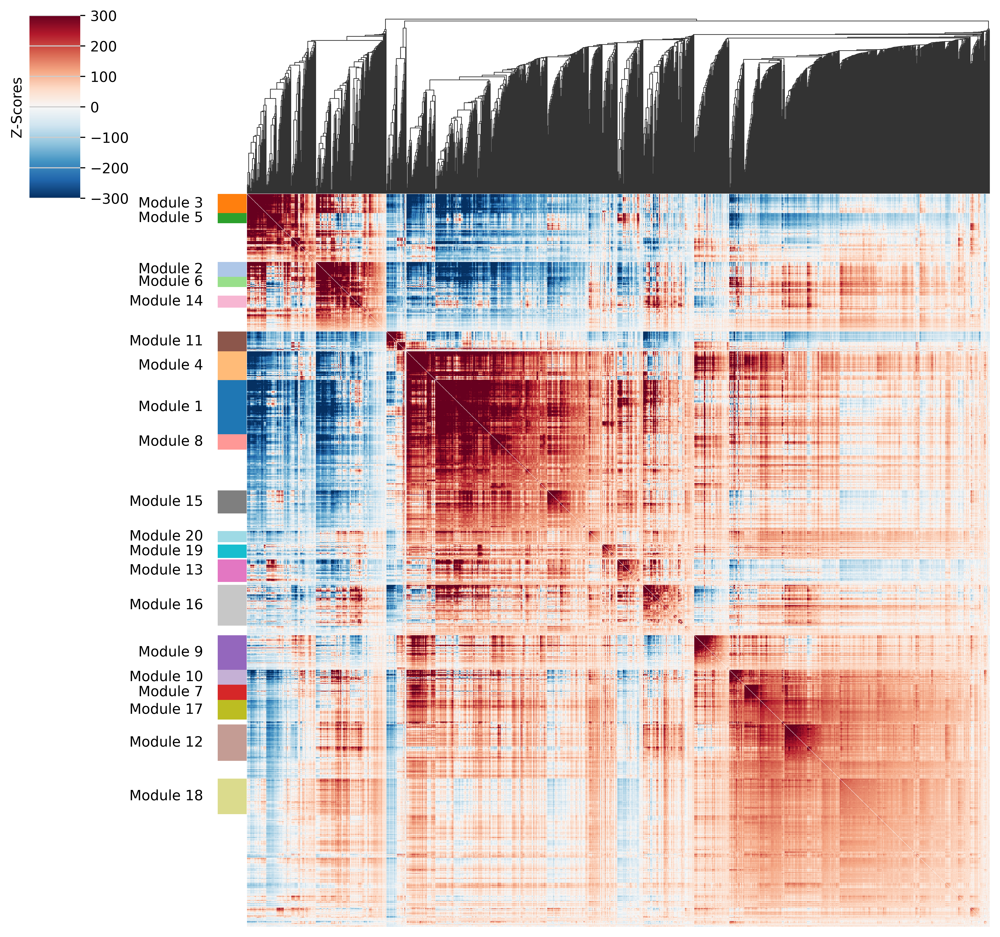

In [42]:
modules = hs.create_modules(min_gene_threshold=20, core_only=True, fdr_threshold=0.01)
modules.sort_values(ascending=True).to_csv(f'{RESULTS_FOLDERNAME}/Allsamples-hotspot_modules.csv',index=True)
print(modules.value_counts())
hs.plot_local_correlations(mod_cmap='tab20', vmin=-300, vmax=300)
plt.savefig(f'{RESULTS_FOLDERNAME}/Allsamples-Hotspot-Heatmap.pdf', bbox_inches='tight')

In [10]:
module_scores = hs.calculate_module_scores()
module_cols = []
for c in module_scores.columns:
    key = f"Module {c}"
    adata.obs[key] = module_scores[c]
    module_cols.append(key)
module_scores.to_csv(f'{RESULTS_FOLDERNAME}/Allsamples-hotspot_module_score.csv',index=True, header=module_cols)

Computing scores for 20 modules...


100%|██████████| 20/20 [01:05<00:00,  3.28s/it]


In [8]:
modules = pd.read_csv(f'{RESULTS_FOLDERNAME}/Allsamples-hotspot_modules.csv')
modules.index = modules["Precursor (Da)"].astype(str)
module_scores = pd.read_csv(f'{RESULTS_FOLDERNAME}/Allsamples-hotspot_module_score.csv', index_col=0)

In [ ]:
module_cols = module_scores.columns

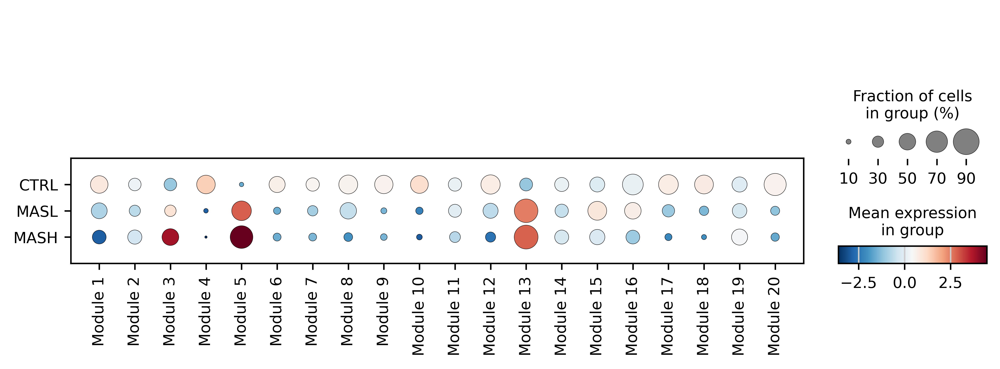

In [30]:
# Identification of Disease-relevant metabolic modules
#sc.pl.stacked_violin(adata, var_names=module_cols, groupby='disease_status', cmap='RdBu_r', save='_Disease_status_Modules.pdf', swap_axes=False)
sc.pl.dotplot(adata, var_names=module_cols, groupby='disease_status', cmap='RdBu_r', save='_Disease_status_Modules.pdf', swap_axes=False)

In [6]:
adata.obs['disease_status'] = adata.obs['disease_status'].cat.rename_categories({'MASLD': 'MASL'})
adata.obs['disease_status'] = adata.obs['disease_status'].cat.reorder_categories(['CTRL', 'MASL', 'MASH'])
adata.obs['sample'] = adata.obs['sample'].str.replace('MASLD', 'MASL')
adata.obs_names = adata.obs_names.str.replace("MASLD", "MASL")

In [22]:
adata.layers["scaled"] = sc.pp.scale(adata.X, copy=True)

In [31]:
adata.var['annotation'] = adata.var.apply(lambda row: row['物质'] if row['物质'] != '-' else row['Compounds'], axis=1)

In [ ]:
# heatmap visualization for MASH-specic metabolic modules
Module_num = 3
Metabolites_vis = modules[modules ==  Module_num].index

markerrange = adata[:, adata.var_names.isin(Metabolites_vis)].layers['scaled'].tolist()
minv = np.quantile(markerrange, 0.01)
maxv = np.quantile(markerrange, 0.99)

# For Module 5
#Metabolites_vis = adata.var.loc[modules[modules == Module_num].index, 'annotation'].dropna().values
#sc.pl.heatmap(adata, Metabolites_vis, groupby='disease_status', cmap='coolwarm', dendrogram=False, swap_axes=True, layer='scaled', vmax=maxv, vmin=minv, gene_symbols='annotation', show_gene_labels=True, save=f'_Module{Module_num}')

# For Module 3 and 13
Metabolites_vis = adata.var.loc[modules[modules == Module_num].index, 'Compounds'].dropna().values
sc.pl.heatmap(adata, Metabolites_vis, groupby='disease_status', cmap='coolwarm', dendrogram=False, swap_axes=True, layer='scaled', vmax=maxv, vmin=minv, gene_symbols='Compounds', show_gene_labels=True, save=f'_Module{Module_num}')

In [ ]:
# SpatialDimplot for Disease-relevant metabolic modules
adata.obs.library_id = adata.obs['sample']
topic_viz = 'Module 13'
vmax = np.percentile(adata.obs[topic_viz], 99.3)
vmin = np.percentile(adata.obs[topic_viz], 1)
#adata.obs['Fibrosis_group'] = 
fig, axs = plt.subplots(3, 4, figsize=(16, 9), gridspec_kw={'wspace': 0.3, 'hspace': 0.1})
#adata_concat.obs['library_id'].unique()
samples = ['CTRL-179', 'MASLD-1492', 'MASH-1481', 'MASH-1086',
           'CTRL-5759', 'MASLD-1498', 'MASH-1478', 'MASH-8684',
           'CTRL-161', 'MASLD-4973', 'MASH-1494', 'MASH-7866',
           'CTRL-8715', 'MASLD-1497', 'MASH-1475', 'MASH-9136']

samples = [ 'MASLD-1492', 'MASH-1086',
           'CTRL-5759', 'MASH-8684',
            'MASLD-4973', 'MASH-7866',
           'CTRL-8715', 'MASH-9136']
samples = ['CTRL-179', 'MASL-1493', 'MASH-1478', 'MASH-8684',
            'CTRL-161', 'MASL-1497', 'MASH-1501', 'MASH-9136',
           'CTRL-180', 'MASL-1498', 'MASH-1494', 'MASH-1086']
for library_id in samples:
    ss = samples.index(library_id)
    _sc_0 = sc.pl.spatial(adata[(adata.obs['sample'] == library_id)], color=topic_viz, ncols=1, show=False, cmap='coolwarm', img_key=None, spot_size=1.5, frameon=False, ax=axs[ss//4,ss%4], alpha=1, add_outline=False, vmax='p95', vmin='p5') #, vmax=vmax, , vmin=vmin, # , colorbar_loc=None
    _sc_0[0].set_title(f'{library_id} (F{adata[adata.obs.library_id == library_id].obs.Fibrosis[0]})', size=12)
    #_sc_0[0].set_title(f'{library_id}', size=12)
plt.tight_layout()
plt.savefig(f'/data/project/AI4Omic/MASLD/results/SM/Hotspot/{topic_viz}_16samples.pdf', dpi=300, bbox_inches='tight')

/home/bailab/miniconda3/envs/hotspot/lib/python3.11/site-packages/anndata/_core/anndata.py:1146: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  df[key] = c


In [ ]:
# SpatialDimplot for Disease-relevant metabolic modules
adata.obs.library_id = adata.obs['sample']
topic_viz = '877.7264'
vmax = np.percentile(adata[:, topic_viz].X.A, 95)
vmin = np.percentile(adata[:, topic_viz].X.A, 5)
#adata.obs['Fibrosis_group'] = 
fig, axs = plt.subplots(4, 4, figsize=(16, 16), gridspec_kw={'wspace':0.15, 'hspace':0.01})
#adata_concat.obs['library_id'].unique()
samples = ['CTRL-179', 'MASLD-1492', 'MASH-1481', 'MASH-1086',
           'CTRL-5759', 'MASLD-1498', 'MASH-1478', 'MASH-8684',
           'CTRL-161', 'MASLD-4973', 'MASH-0422', 'MASH-7866',
           'CTRL-8715', 'MASLD-1497', 'MASH-1475', 'MASH-9136']
for library_id in samples:
    ss = samples.index(library_id)
    _sc_0 = sc.pl.spatial(adata[(adata.obs['sample'] == library_id)], color=topic_viz, ncols=1, show=False, cmap='coolwarm', img_key=None, spot_size=1.5, frameon=False, ax=axs[ss//4,ss%4], alpha=1, add_outline=False) #, vmax=vmax, , vmin=vmin,
    _sc_0[0].set_title(f'{library_id} (F{adata[adata.obs.library_id == library_id].obs.Fibrosis[0]})', size=16)
plt.tight_layout()
#plt.savefig(f'/data/project/AI4Omic/MASLD/results/SM/Hotspot/{topic_viz}_16samples.pdf', dpi=300, bbox_inches='tight')

In [ ]:
sample_vis = 'MASH-9136'
with mplscience.style_context():
   adata_vis = adata[adata.obs['sample'] == sample_vis]
   sc.pl.spatial(adata_vis, color='732.5544', frameon=True, vmin="p5", vmax="p95", library_id=None, spot_size=1.5, img_key=None, cmap='coolwarm') #, save = f'Allsamples-Hotspot-Dimplot.pdf'